In [1]:
import sys, os
sys.path.append('../src')
sys.path.append('../models')

from architecture import modules
from data.datasets import BarkleyDataset
from torch.utils.data import DataLoader

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d.axes3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
from mpl_toolkits.axes_grid1 import make_axes_locatable

from pyevtk.hl import gridToVTK

import matplotlib as mpl

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
def loadModel(model_architecture, folder='../../models/weights/', model_file='model'):
    data_dir = os.path.abspath(folder) + '/'
    model_architecture.load_state_dict(torch.load(data_dir + model_file, map_location=device), strict=True)
    return model_architecture

In [4]:
# 3D plot here

prefixes = ['CLSTM', 'STLSTM']
datatype = 'chaotic'
ps = [379,154,481,184,187]
ts = [32]

dataset = BarkleyDataset(root=f'../data/{datatype}/processed/', chaotic=False, train=False,
                         depth=32, time_steps=32)

folder = f'../models/weights/{datatype}'

y,z = [np.arange(0, 121) for _ in range(2)]
x = np.arange(0,33)

for p in ps:
    for prefix in prefixes:
        for t in ts:
            if prefix =="CLSTM":
                model = loadModel(nn.DataParallel(modules.CLSTM(1,64)),folder=folder,
                                  model_file=f'{prefix}_t{t}_d32').to(device)
            elif prefix =="STLSTM":
                model = loadModel(nn.DataParallel(modules.STLSTM(1,64)),folder=folder,
                                  model_file=f'{prefix}_t{t}_d32').to(device)
            else:
                model = None

            with torch.no_grad():
                y_pred = model(dataset[p:p+1][0], max_depth=32).cpu().detach().numpy()[0,0]

            gridToVTK(f"../data/visualization/{prefix}_{datatype}_p{p}_t{t}", x, y, z, cellData = {'u': y_pred})

    y_true = dataset[p:p+1][1].cpu().detach().numpy()[0,0]
    gridToVTK(f"../data/visualization/{datatype}_p{p}_true", x, y, z, cellData = {'u': y_true})

In [ ]:
# 3D anim here

prefixes = ['CLSTM', 'STLSTM']
datatype = 'chaotic'
ps = [379]#,154,481,184,187]
ts = [32]
time_steps = 256
max_depth = 120

dataset = BarkleyDataset(root=f'../data/{datatype}/processed/', chaotic=False, train=False,
                         depth=32, time_steps=32)

folder = f'../models/weights/{datatype}'

y,z = [np.arange(0, 121) for _ in range(2)]
x = np.arange(0,max_depth+1)

for p in ps:
    for prefix in prefixes:
        for t in ts:
            if prefix =="CLSTM":
                model = loadModel(nn.DataParallel(modules.CLSTM(1,64)),folder=folder,
                                  model_file=f'{prefix}_t{t}_d32').to(device)
            elif prefix =="STLSTM":
                model = loadModel(nn.DataParallel(modules.STLSTM(1,64)),folder=folder,
                                  model_file=f'{prefix}_t{t}_d32').to(device)
            else:
                model = None

            with torch.no_grad():
                y_pred = model(dataset[p:p+1][0], max_depth=max_depth).cpu().detach().numpy()[0,0]

            gridToVTK(f"../data/visualization/{prefix}_{datatype}_p{p}_t{t}", x, y, z, cellData = {'u': y_pred})

    y_true = dataset[p:p+1][1].cpu().detach().numpy()[0,0]
    gridToVTK(f"../data/visualization/{datatype}_p{p}_true", x, y, z, cellData = {'u': y_true})

In [10]:
dataset[p:p+1][1].cpu().detach().numpy()[0,0].shape

(32, 120, 120)

In [15]:
y_pred.shape

torch.Size([1, 1, 32, 120, 120])

In [3]:
@torch.no_grad()
def plot_true_pred(model, dataset, p, max_depth=32, savefig=True, savename='plot', diff=False):
    plt.rcParams.update({'font.size': 18})

    fig, axs = plt.subplots(2+diff, max_depth, sharex=True, sharey=True, figsize=(max_depth*2,4+2*diff))
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    plt.xticks([]), plt.yticks([])

    cmap = 'viridis'
    axs[0,0].set_title(f'Depth: {0}')
    axs[0,0].set_ylabel(f'True')

    for i in range(max_depth):
        axs[0,i].set_title(f'Depth: {i}')
        axs[0,i].imshow(dataset[p][1][0,i], cmap=cmap, vmin=0, vmax=1)

    with torch.no_grad():
        y_pred = model(dataset[p][0].unsqueeze(1), max_depth=max_depth)

    for i in range(max_depth):         
        _y_pred = y_pred[i,0,0,:,:]
        axs[1,i].imshow(_y_pred, cmap=cmap, vmin=0, vmax=1)
    #axs[1,0].set_ylabel(f': {time_span+1}')
    
    if savefig:
        plt.savefig(savename, dpi=400, bbox_inches="tight")
    plt.show()
    
@torch.no_grad()
def plot_comp(models, datasets, p, max_depth=32, savefig=True, savename='plot', 
              diff=False, xlabels=None):
    plt.rcParams.update({'font.size': 18})
    cmap = 'viridis'               

    fig, axs = plt.subplots(1+len(models), max_depth, sharex=True, sharey=True, figsize=(max_depth*2,(1+len(models))*2))
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    plt.xticks([]), plt.yticks([])

    axs[0,0].set_title(f'Depth: {0}')
    axs[0,0].set_ylabel(f'True')

    for i in range(max_depth):
        axs[0,i].set_title(f'Depth: {i}')
        axs[0,i].imshow(datasets[0][p][1][0,i], cmap=cmap, vmin=0, vmax=1)

    for n, model in enumerate(models):
        with torch.no_grad():
            #print(datasets[n][p][0].unsqueeze(1).shape) # torch.Size([8, 1, 1, 120, 120])
            y_pred = model(datasets[n][p][0].unsqueeze(0).to(device), max_depth=max_depth)

            print('y_pred:', y_pred.shape) # torch.Size([16, 8, 1, 120, 120])
        for i in range(max_depth):         
            _y_pred = y_pred[0,0,i,:,:].cpu().detach().numpy()
            axs[n+1,i].imshow(_y_pred, cmap=cmap, vmin=0, vmax=1)
        axs[n+1,0].set_ylabel(xlabels[n])

    if savefig:
        plt.savefig('multiplots/' + savename, dpi=400, bbox_inches="tight")
    plt.show()

@torch.no_grad()
def plot_single_images(models, datasets, p, max_depth=32):
    plt.tight_layout()
    plt.rcParams.update({'font.size': 18})
    cmap = 'viridis'

    for i in range(max_depth):
        plt.imshow(datasets[0][p][1][0,i], cmap=cmap, vmin=0, vmax=1)
        plt.xticks([])
        plt.yticks([])
        plt.savefig(f'singleplots/p{p}_true_depth{i}', dpi=400)
        plt.clf()
    
    for n, model in enumerate(models):
        with torch.no_grad():
            y_pred = model(datasets[n][p][0].unsqueeze(0).to(device), max_depth=max_depth)

        for i in range(max_depth):         
            _y_pred = y_pred[0,0,i,:,:].cpu().detach().numpy()
            plt.xticks([])
            plt.yticks([])
            plt.imshow(_y_pred, cmap=cmap, vmin=0, vmax=1)
            plt.savefig(f'singleplots/p{p}_model{n}_depth{i}', dpi=400)
            plt.clf()
            
@torch.no_grad()
def plot_stacks(models, datasets, p, depths, diff=False):  
    fig = plt.figure(figsize=(8.,8.))
    ax = fig.gca(projection='3d')
    x_scale, y_scale, z_scale = 1,1,2
    scale=np.diag([x_scale, y_scale, z_scale, 1.0])
    scale=scale*(1.0/scale.max())
    scale[3,3]=1.0
    def short_proj():
        return np.dot(Axes3D.get_proj(ax), scale)
    ax.get_proj=short_proj
    x = np.arange(0, 120, 1)
    y = np.arange(0, 120, 1)
    x, y = np.meshgrid(x, y)
    z = np.zeros_like(x)
    plt.tight_layout()
    plt.rcParams.update({'font.size': 18})
    cmap = 'viridis' 
    plt.xticks([]), plt.yticks([])
    plt.tight_layout()
    for i in depths:
        ax.plot_surface(x,y, -(z+i), rstride=1, cstride=1, facecolors=cm.coolwarm(datasets[0][p][1][0,i]))
        #-66.0321715817692, 10, 17.69436997319059
    ax.set_zticks([])
    
    ax.azim = -66.0321
    ax.dist = 10
    ax.elev = 17.6943
    
    plt.savefig(f'cubeplots/p{p}_true_depth{i}', dpi=400, bbox_inches="tight")
    plt.clf()
    
    for n, model in enumerate(models):
        with torch.no_grad():
            y_pred = model(datasets[n][p][0].unsqueeze(0).to(device), max_depth=max_depth)
            
        fig = plt.figure(figsize=(8.,8.))
        ax = fig.gca(projection='3d')
        x_scale, y_scale, z_scale = 1,1,2
        scale=np.diag([x_scale, y_scale, z_scale, 1.0])
        scale=scale*(1.0/scale.max())
        scale[3,3]=1.0
        def short_proj():
            return np.dot(Axes3D.get_proj(ax), scale)
        ax.get_proj=short_proj
        x = np.arange(0, 120, 1)
        y = np.arange(0, 120, 1)
        x, y = np.meshgrid(x, y)
        z = np.zeros_like(x)
        plt.tight_layout()
        plt.rcParams.update({'font.size': 18})
        cmap = 'viridis' 
        plt.xticks([]), plt.yticks([])
    
        for i in depths:
            _y_pred = y_pred[0,0,i,:,:].cpu().detach().numpy()
            ax.plot_surface(x,y, -(z+i), rstride=1, cstride=1, facecolors=cm.coolwarm(_y_pred))
        ax.set_zticks([])
        ax.azim = -66.0321
        ax.dist = 10
        ax.elev = 17.6943
    
        plt.savefig(f'cubeplots/p{p}_model{n}_depth{i}', dpi=400, bbox_inches="tight")
        plt.clf()
    
    if diff:
        for n, model in enumerate(models):
            with torch.no_grad():
                y_pred = model(datasets[n][p][0].unsqueeze(0).to(device), max_depth=max_depth)

            fig = plt.figure(figsize=(8.,8.))
            ax = fig.gca(projection='3d')
            x_scale, y_scale, z_scale = 1,1,2
            scale=np.diag([x_scale, y_scale, z_scale, 1.0])
            scale=scale*(1.0/scale.max())
            scale[3,3]=1.0
            def short_proj():
                return np.dot(Axes3D.get_proj(ax), scale)
            ax.get_proj=short_proj
            x = np.arange(0, 120, 1)
            y = np.arange(0, 120, 1)
            x, y = np.meshgrid(x, y)
            z = np.zeros_like(x)
            plt.tight_layout()
            plt.rcParams.update({'font.size': 18})
            plt.xticks([]), plt.yticks([])

            for i in depths:
                _y_pred = y_pred[0,0,i,:,:].cpu().detach().numpy() - datasets[0][p][1][0,i].cpu().detach().numpy()
                
                ax.plot_surface(x,y, -(z+i), rstride=1, cstride=1, facecolors=cm.seismic((_y_pred+1)/2))
            ax.set_zticks([])
            ax.azim = -66.0321
            ax.dist = 10
            ax.elev = 17.6943

            plt.savefig(f'cubeplots/diff_p{p}_model{n}_depth{i}', dpi=400, bbox_inches="tight")
            plt.clf()



In [4]:
def explore(dataset, num_p=12, max_depth=16):
    plt.rcParams.update({'font.size': 22})
    ps = np.random.choice(len(dataset),num_p, replace=False)
    for p in ps:
        fig, axs = plt.subplots(1, max_depth, sharex=True, sharey=True, figsize=(max_depth*2,2))
        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
        plt.xticks([]), plt.yticks([])
        axs[0].set_ylabel(p)
        cmap = 'viridis'
        for i in range(max_depth):
            axs[i].imshow(dataset[p][1][0,i], cmap=cmap, vmin=0, vmax=1)
        plt.show()

In [5]:
def pred_true_pair(model, dataset, p, max_depth=32, savefig=True, savename='', diff=False):
    with torch.no_grad():
        y_pred = model(dataset[p][0].unsqueeze(0), max_depth=max_depth)

    x = np.arange(0, max_depth+1)
    y = np.arange(0, 121)
    z = np.arange(0, 121)
    
    _savename = f'{savename}_p{p}'
    
    true = dataset[p][1][0].cpu().detach().numpy()
    pred = y_pred[0,0].cpu().detach().numpy()
    
    gridToVTK(_savename + '_true', x, y, z, cellData = {'u': true})
    gridToVTK(_savename + '_pred', x, y, z, cellData = {'u': pred})
    
    
    return true, pred

In [7]:
dataset = BarkleyDataset(root='../data/chaotic/processed/', chaotic=False, train=False,
                         depth=32, time_steps=32)

In [13]:
torch.mean(torch.abs(dataset[:][1] - torch.mean(dataset[:][1])))

tensor(0.3794)

In [9]:
prefix = 'CLSTM'
for t in [1]:#,8,16,32]:
    model = loadModel(nn.DataParallel(modules.CLSTM(1,64)),folder='../models/weights/chaotic',
                        model_file=f'{prefix}_t{t}_d32').to(device)
    p = 379
    true, pred = pred_true_pair(model, dataset, p, savename=f'{prefix}_T{t}')

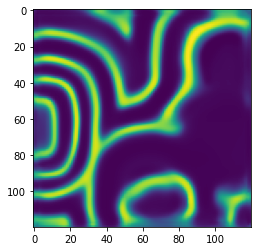

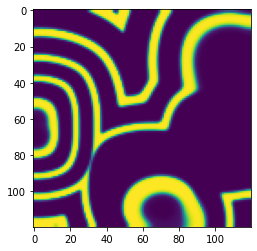

(<matplotlib.image.AxesImage at 0x7f1c30208820>, None)

In [20]:
pred.shape, true.shape
plt.imshow(pred[20].T), plt.show()
plt.imshow(true[20].T), plt.show()

In [11]:
#%matplotlib notebook

ts = [1,8,16,32]#[1,8,16,32]
d=32
max_depth = 32
depths = [0,4,8,12,16]

prefix = 'STLSTM'
models = [loadModel(nn.DataParallel(modules.STLSTM(1,64)),
                    folder='../models/weights/concentric',
                    model_file=f'{prefix}_t{t}_d32').to(device) for t in ts]
 
xlabels = [f'Time-steps: {ts[0]}'] + [t for t in ts]
datasets = [BarkleyDataset(root='../data/concentric/processed/', chaotic=False, train=False,depth=max_depth, 
                               time_steps=t) for t in ts]
p = 375
#plot_comp(models, datasets, p, max_depth=max_depth, savename=f'p{p}', xlabels=xlabels)
#plot_single_images(models, datasets, p, max_depth=max_depth)
a = plot_stacks(models, datasets, p, depths, diff=True)


del datasets

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

In [27]:
a.azim, a.dist, a.elev

(-66.0321715817692, 10, 17.69436997319059)

In [18]:
[0] + [2,3,4]

[0, 2, 3, 4]

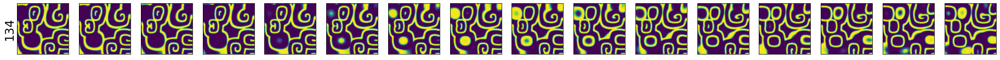

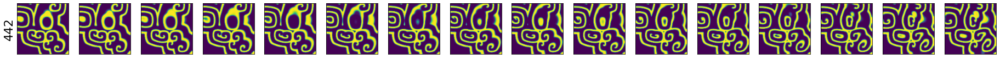

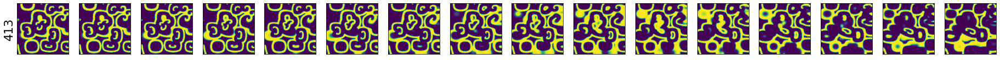

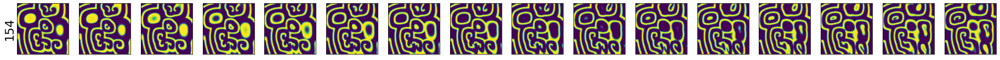

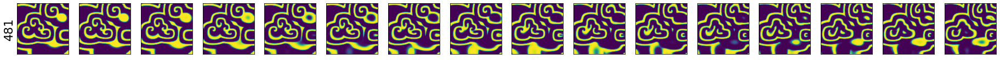

...

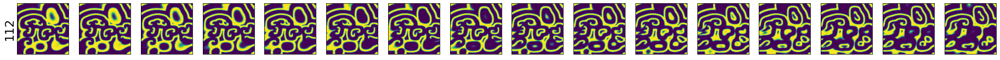

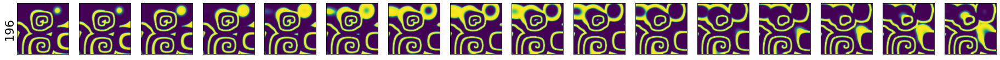

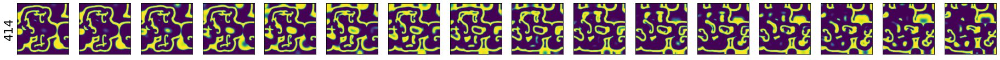

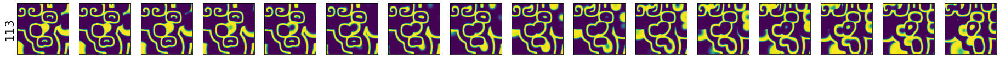

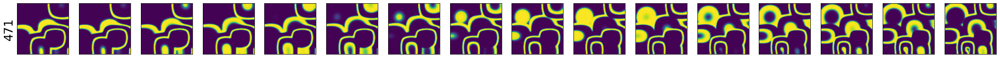

In [11]:
explore(dataset, num_p=32)

In [23]:
t = 12
model = loadModel(modules.STLSTM(1,64, directional=1), 
                  folder='../models/weights/concentric', model_file=f'model_{t}')
 
dataset = BarkleyDataset(root='../data/concentric/processed/', chaotic=False, train=False,depth=16, 
                               time_steps=t)
p = 408
plot_true_pred(model, dataset, p, max_depth=16, savename=f'p{p}')

FileNotFoundError: [Errno 2] No such file or directory: '/home/roland/Projekte/Masterthesis/UnderSurface/models/weights/concentric/model_12'

In [32]:
datasets[0][p][1].shape

torch.Size([1, 16, 120, 120])

In [44]:
a = [0,1,2,3,4,5,6]
a[-2:]
a = torch.Varia1)
a

AttributeError: module 'torch' has no attribute 'Variable'

In [7]:
t = 8
model = loadModel(nn.DataParallel(modules.CLSTM(1,64, directional=1), 
                  folder='../models/weights/concentric', model_file=f'CLSTM{t}'))
 
dataset = BarkleyDataset(root='../data/concentric/processed/', chaotic=False, train=False,depth=16, 
                               time_steps=t)
p = 218
plot_true_pred(model, dataset, p, max_depth=16, savename=f'p{p}')

TypeError: __init__() got an unexpected keyword argument 'folder'

In [28]:
dataset[0][0][0,0,0][-1220:]

tensor([0.9882, 0.9882, 0.9882, 0.9882, 0.9882, 0.9882, 0.9882, 0.9882, 0.9922,
        0.9922, 0.9922, 0.9961, 0.9961, 0.9961, 0.9961, 0.9961, 0.9961, 0.9961,
        0.9961, 0.9961, 0.9882, 0.9216, 0.5333, 0.2902, 0.4980, 0.9647, 0.9922,
        0.9882, 0.8510, 0.0902, 0.0118, 0.0039, 0.0039, 0.0039, 0.0039, 0.0078,
        0.0706, 0.6235, 0.9686, 0.9882, 0.9020, 0.2078, 0.0235, 0.0039, 0.0039,
        0.0039, 0.0039, 0.0039, 0.0353, 0.3059, 0.9569, 0.9922, 0.9922, 0.9569,
        0.6863, 0.0863, 0.0118, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
        0.0039, 0.0039, 0.0039, 0.0039, 0.0118, 0.1137, 0.6549, 0.9255, 0.9882,
        0.9961, 0.9725, 0.7137, 0.0941, 0.0118, 0.0039, 0.0039, 0.0039, 0.0078,
        0.0549, 0.7843, 0.9804, 0.9725, 0.7765, 0.0902, 0.0078, 0.0039, 0.0039,
        0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0353, 0.4118, 0.8314, 0.9529,
        0.9882, 0.9961, 0.9961, 0.9961, 0.9843, 0.8706, 0.2471, 0.0431, 0.0078,
        0.0039, 0.0039, 0.0039, 0.0039, 

RuntimeError: CUDA out of memory. Tried to allocate 1.76 GiB (GPU 0; 5.81 GiB total capacity; 2.73 GiB already allocated; 1.28 GiB free; 3.40 GiB reserved in total by PyTorch)

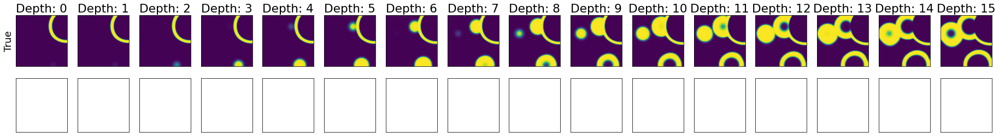

In [9]:
p = 148
plot_true_pred(model, dataset, p, max_depth=16, savename=f'p{p}')

In [9]:
for i in range(1):
    p = i + 1007

    plot_true_pred(loadModel(nn.DataParallel(modules.STLSTM(1,64, directional=1), 
                                           folder='../models/weights/concentric', 
                                           model_file='STLSTM_final')), 
                   _X[:,p:p+1], 
                   _y[:,p:p+1], 
                   max_depth=16,
                  savename=f'p{p}',
                  diff=True)

TypeError: __init__() got an unexpected keyword argument 'folder'

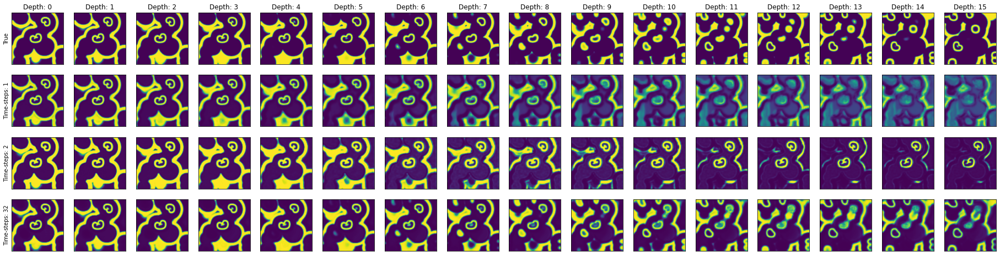

In [7]:
p = 1007

models = [modules.Model(loadModel(modules.STLSTM(1,64, directional=1),
                                  folder='../models/weights/concentric', 
                                  model_file='STLSTM_1')),
          modules.Model(loadModel(modules.STLSTM(1,64, directional=1),
                                  folder='../models/weights/concentric', 
                                  model_file='STLSTM_2')),
          modules.Model(loadModel(modules.STLSTM(1,64, directional=1),
                                  folder='../models/weights/concentric', 
                                  model_file='STLSTM_32'))]

labels = ['Time-steps: 1', 'Time-steps: 2', 'Time-steps: 32']
num_points = [1,2,32]

plot_comparison(models, _X[:,p:p+1], _y[:,p:p+1], max_depth=16, savename=f'comp_p{p}', labels=labels, num_points=num_points)
          

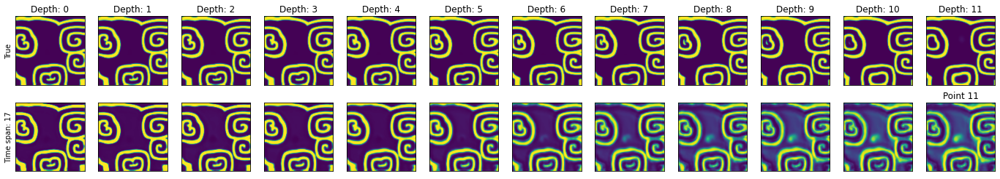

In [42]:
p = 3
plot_true_pred(modules.Model(loadModel(modules.CLSTM(1,64, directional=1), model_file='CLSTM_NT16_chaos_ep9')), 
               _X[:,p:p+1], _y[:,p:p+1], max_depth=12)
#plt.savefig('hey')

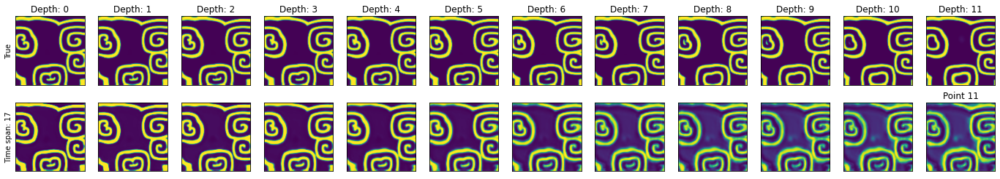

In [43]:
plot_true_pred(modules.Model(loadModel(modules.CLSTM(1,64, directional=1), model_file='CLSTM_NT16_chaos_ep5')), 
               _X[:,p:p+1], _y[:,p:p+1], max_depth=12)
#plt.savefig('hey')

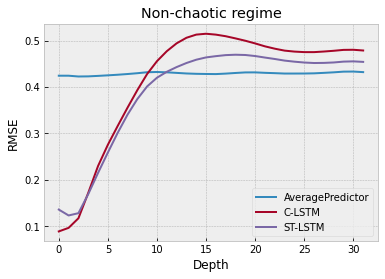

In [18]:
plt.style.use('bmh')
s = [0,32]
plt.plot(range(s[0],s[1]), Avg16_rmse[s[0]:s[1]], label='AveragePredictor')
plt.plot(range(s[0],s[1]),CLSTM16_rmse[s[0]:s[1]], label='C-LSTM')
plt.plot(range(s[0],s[1]), STLSTM16_rmse[s[0]:s[1]], label='ST-LSTM')
plt.legend()
plt.title('Non-chaotic regime')
plt.xlabel('Depth')
plt.ylabel('RMSE')
plt.savefig('RMSE', dpi=400, bbox_inches="tight" )

ValueError: x and y must have same first dimension, but have shapes (32,) and (6,)

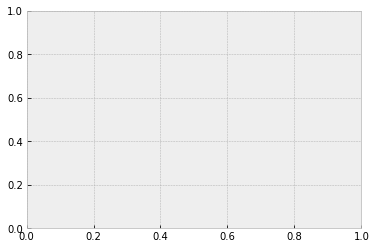

In [123]:
plt.style.use('bmh')
s = [0,32]
plt.plot(range(s[0],s[1]), Avg16_emd[s[0]:s[1]], label='AveragePredictor')
plt.plot(range(s[0],s[1]),CLSTM16_emd[s[0]:s[1]], label='C-LSTM')
plt.plot(range(s[0],s[1]), STLSTM16_emd[s[0]:s[1]], label='ST-LSTM')
plt.legend()
plt.title('Non-chaotic regime')
plt.xlabel('Depth')
plt.ylabel('EMD')
plt.savefig('EMD', dpi=400, bbox_inches="tight" )

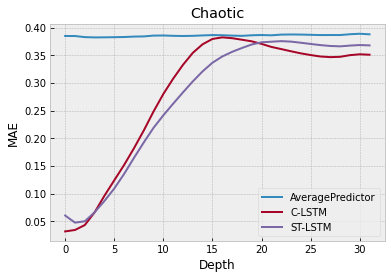

In [19]:
plt.style.use('bmh')
s = [0,32]
plt.plot(range(s[0],s[1]), Avg16_mae[s[0]:s[1]], label='AveragePredictor')
plt.plot(range(s[0],s[1]),CLSTM16_mae[s[0]:s[1]], label='C-LSTM')
plt.plot(range(s[0],s[1]), STLSTM16_mae[s[0]:s[1]], label='ST-LSTM')
#plt.plot(range(s[0],s[1]),MIM16_mae[s[0]:s[1]], label='MIM-LSTM')
plt.legend()
plt.title('Chaotic')
plt.xlabel('Depth')
plt.ylabel('MAE')
plt.savefig('MAE', dpi=400, bbox_inches="tight" )

In [48]:
ssim_b(np.zeros((120,120,3)), np.zeros((120,120,3)))

1.0

In [8]:
def plot_true_pred(model, n=16, max_depth=32, p=288, name='CLSTM_NT16', load_weights=True, savefig=True, savename='CLSTM'):
    
    fig, axs = plt.subplots(2, max_depth, sharex=True, sharey=True, figsize=(max_depth*2,4))
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    plt.xticks([]), plt.yticks([])

    cmap = 'viridis'
    #axs[0,0].imshow(y[0,p,0,:,:].astype(np.float64), cmap=cmap)
    axs[0,0].set_title(f'Depth: {0}')
    axs[0,0].set_ylabel(f'True')
    
    axs[1,0].set_ylabel(f'Predicted')

    #axs[1, 0].axis('off')
    for i in range(max_depth):
        y_true = y[0,p,i,:,:]
        axs[0,i].set_title(f'Depth: {i}')
        axs[0,i].imshow(y_true.astype(np.float64), cmap=cmap)

    time_length = len(X)
    time_span = n

        
    a = time_length//2 - time_span
    b = time_length//2 + time_span + 1

    _X = X[a:b,p:p+1]
    
    if load_weights:
        model.model = loadModel(model.model, model_file=name)
        
    with torch.no_grad():
        y_pred = model.predict(_X, max_depth=max_depth) # [depths,batch_size=1,features=1,:,:]

    for i in range(max_depth):
        _y_pred = y_pred[i,0,0,:,:]
        axs[1,i].imshow(_y_pred.astype(np.float64), cmap=cmap)
    axs[1,0].set_ylabel(f'Time span: {time_span+1}')

    if savefig:
        fig.savefig(savename, dpi=400, bbox_inches="tight")
    plt.title(f'Point {i}')
    plt.show()

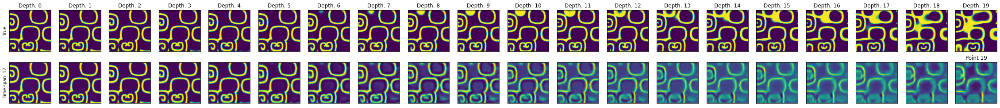

In [14]:
p = 890
plot_true_pred(modules.Model(modules.CLSTM(1,32, directional=2)), n=16, max_depth=20, p=p, name='CLSTM_NT16_chaos', savename=f'CLSTM_NT16_p{p}')
#plot_true_pred(modules.Model(modules.STLSTM(1,22, directional=2)), n=16, max_depth=20, p=p, name='STLSTM_NT16', savename=f'STLSTM_NT16_p{p}')

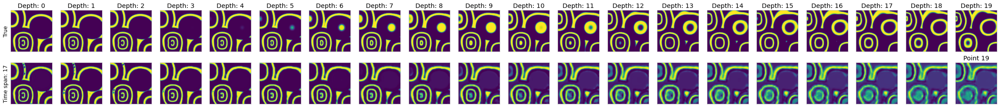

In [18]:
plot_true_pred(modules.Model(modules.STLSTM(1,32, directional=2)), n=16, max_depth=20, p=p, name='STLSTM_NT16', savename=f'STLSTM_NT16_p{p}')

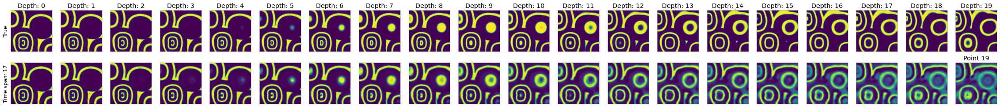

In [15]:
plot_true_pred(modules.Model(modules.CLSTM(1,32, directional=2)), n=16, max_depth=20, p=p, name='CLSTM_NT16', savename=f'MIM_NT16_p{p}')

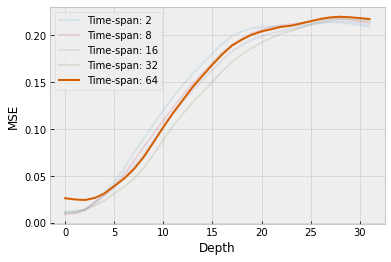

In [44]:
plt.style.use('bmh')

a=0.12
plt.plot(range(32),m2, label='Time-span: 2', alpha=a)
#plt.plot(range(32), m4, label='Time-span: 4')
plt.plot(range(32), m8, label='Time-span: 8', alpha=a)
plt.plot(range(32), m16, label='Time-span: 16', alpha=a)
plt.plot(range(32), m32, label='Time-span: 32', alpha=a)
plt.plot(range(32), m64, label='Time-span: 64')


plt.legend()

plt.xlabel('Depth')
plt.ylabel('MSE')

plt.savefig('depth_vs_mse_64', dpi=400, bbox_inches="tight" )

#plt.xlim([0,10])
#plt.ylim([0,0.02])
#plt.title('Same model, trained with different input time-spans around the target time to be predicted')

In [9]:
n1 = getMSE_per_depth(n=16, dt=1)
n2 = getMSE_per_depth(n=16, dt=2)
#m8 = getMSE_per_depth(n=8)
#m16 = getMSE_per_depth(n=16)
#m32 = getMSE_per_depth(n=32)
#m64 = getMSE_per_depth(n=64)

In [35]:
ssim(np.zeros((120,120,1)), np.zeros((120,120,1)), multichannel=True)

ssim_b = lambda img1, img2: ssim(img1, img2, multichannel=True)
ssim_b(np.zeros((120,120,1)), np.zeros((120,120,1)))

1.0

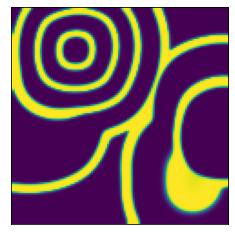

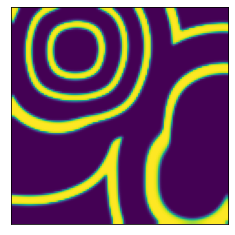

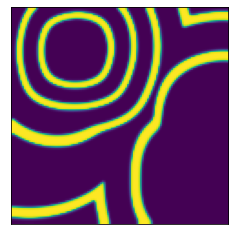

(None, None)

In [10]:
#plot time series

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
plt.xticks([]), plt.yticks([])

p = 100
plt.imshow(X_test[0,p,0,:,:].astype(np.float64)), plt.xticks([]), plt.yticks([])
plt.savefig('p200_t0', dpi=400, bbox_inches="tight"),plt.show()

plt.imshow(X_test[64,p,0,:,:].astype(np.float64)), plt.xticks([]), plt.yticks([])
plt.savefig('p200_t40', dpi=400, bbox_inches="tight"),plt.show()

plt.imshow(X_test[127,p,0,:,:].astype(np.float64)), plt.xticks([]), plt.yticks([])
plt.savefig('p200_t127', dpi=400, bbox_inches="tight"),plt.show()


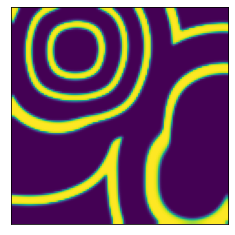

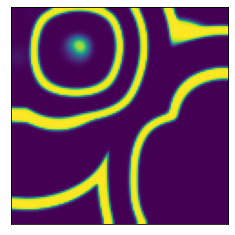

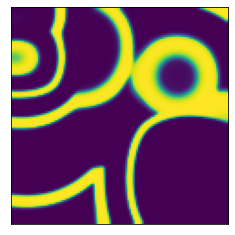

(None, None)

In [15]:
#plot layer series

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
plt.xticks([]), plt.yticks([])

p = 100
plt.imshow(y_test[0,p,0,:,:].astype(np.float64)), plt.xticks([]), plt.yticks([])
plt.savefig('p200_d0', dpi=400, bbox_inches="tight"),plt.show()

plt.imshow(y_test[0,p,16,:,:].astype(np.float64)), plt.xticks([]), plt.yticks([])
plt.savefig('p200_d16', dpi=400, bbox_inches="tight"),plt.show()

plt.imshow(y_test[0,p,31,:,:].astype(np.float64)), plt.xticks([]), plt.yticks([])
plt.savefig('p200_d31', dpi=400, bbox_inches="tight"),plt.show()

In [22]:
a = np.load('/home/roland/Projekte/Masterthesis/UnderSurface/src/simulation/visualize_concentric089226890.npy')
b = np.load('/home/roland/Projekte/Masterthesis/UnderSurface/src/simulation/visualize_concentric089226891.npy')
c = np.load('/home/roland/Projekte/Masterthesis/UnderSurface/src/simulation/visualize_concentric089226892.npy')
d = np.load('/home/roland/Projekte/Masterthesis/UnderSurface/src/simulation/visualize_concentric089226893.npy')

_X = torch.tensor(np.concatenate([a,b,c,d],axis=0))
del a,b,c,d

transform = lambda data:(data.float()+127)/255.

#X = transform(X[:,:time_steps])

In [23]:
X = transform(_X[:,:1,:,:])
Y = transform(_X[:,:,:,:])
del _X

In [6]:
prefix = "STLSTM"
t=30

model = loadModel(nn.DataParallel(modules.STLSTM(1,64)),folder='../models/weights/concentric',
                        model_file=f'{prefix}_t{t}_d32').to(device)

In [15]:
x = np.arange(0, 121)
y = np.arange(0, 121)
z = np.arange(0, 121)


In [16]:
f"data_concentric_f{t:03}"
t

30

In [26]:
@torch.no_grad()
def pred(t=0, max_depth=32):
    y_pred = model(X[t:t+30].unsqueeze(0), max_depth=max_depth)
    return y_pred

def toVTK(y_pred, t=0):
    _y = (y_pred[0,0].cpu().detach().numpy()*255-128).astype(np.int8)
    print(_y.shape)
    gridToVTK(f"/home/roland/Projekte/Masterthesis/UnderSurface/data/visualization/anim/concentric_pred/data_concentric_f{t:03}", x, y, z, 
              cellData = {'u': _y})
    
def toVTK_true(y_true, t=0):
    y_true = (y_true.cpu().detach().numpy()*255-128).astype(np.int8)
    print(y_true.shape)
    gridToVTK(f"/home/roland/Projekte/Masterthesis/UnderSurface/data/visualization/anim/concentric_true/data_concentric_f{t:03}", x, y, z, 
              cellData = {'u': y_true})

In [21]:
for i in range(120):
    y_pred = pred(t=i, max_depth=120)
    toVTK(y_pred,t=i)

(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 12

In [28]:
for i in range(120):
    #y_pred = pred(t=i, max_depth=120)
    toVTK_true(Y[i], t=i)

(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 120, 120)
(120, 12

In [24]:
Y.shape

torch.Size([512, 120, 120, 120])

In [30]:
y_pred.shape

torch.Size([1, 1, 32, 120, 120])

In [47]:
(y_pred[0,0].cpu().detach().numpy()*255-128).astype(np.int8).shape

(32, 120, 120)

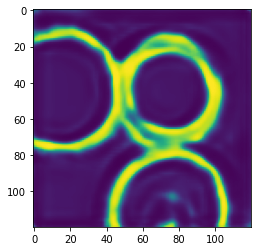

In [34]:
plt.imshow(y_pred[0,0,8,:,:].cpu())